# Latent space models on networks

In [ ]:

from LSMN_P import *

# Network

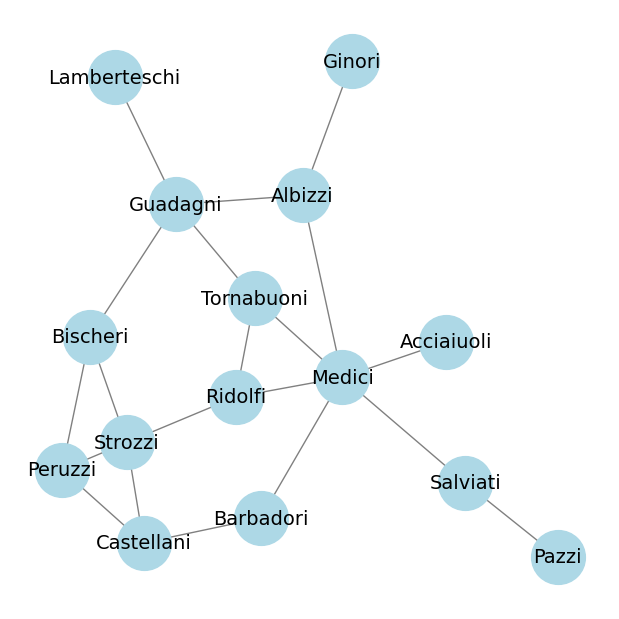

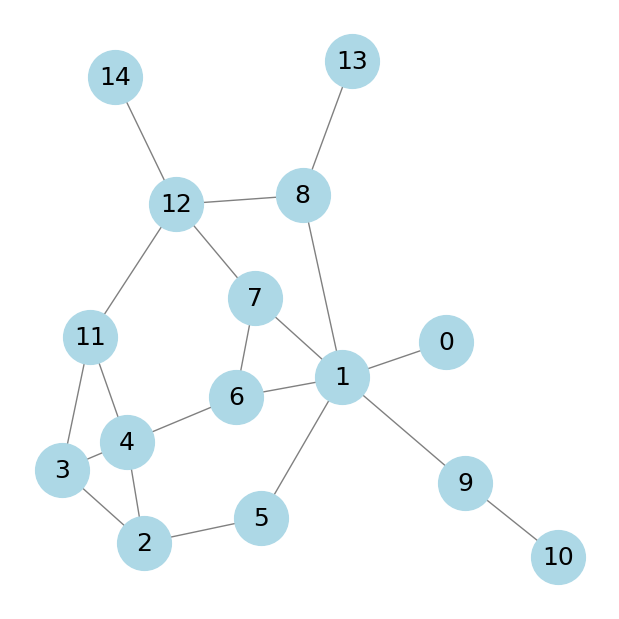

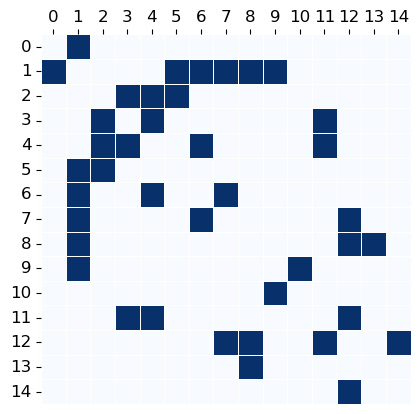

In [2]:
G = nx.florentine_families_graph()
pos = nx.spring_layout(G, seed=80)
plt.figure(figsize=(6,6))
nx.draw(G, pos=pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1500, font_size=14)
#plt.title("Florentine Families network")
plt.show()

G = nx.florentine_families_graph()
node_mapping = {node: i for i, node in enumerate(G.nodes())}
G = nx.relabel_nodes(G, node_mapping)
n = len(G.nodes)
plt.figure(figsize=(6,6))
pos_relabel = {node_mapping[k]: v for k, v in pos.items()}
nx.draw(G,  pos=pos_relabel, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1500, font_size=18)
#plt.title("Florentine Families network with relabeled nodes")
plt.show()
#print("Map from original nodes to new nodes:")
#print(node_mapping)

Y = nx.to_numpy_array(G, dtype=float)

sns.heatmap(Y, annot=False, cmap="Blues", cbar=False, square=True, linewidths=0.5, linecolor='white')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.gca().xaxis.tick_top() 
plt.gca().tick_params(top=True, bottom=False, labeltop=True, labelbottom=False, labelsize=12)
#plt.title("Sociomatrix for Florentine families")
plt.show() 

# Model $\mathbb{R}^1$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 50
Number of draws per chain: 300000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 25 starts: -42.8836
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 50510/300000 [00:14<01:03, 3902.98 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 3.7311
Final sigma_q_alpha: 1.1384


Sampling progress: 100%|██████████| 300000/300000 [01:10<00:00, 4226.38 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 50934/300000 [00:12<01:00, 4146.47 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 3.8830
Final sigma_q_alpha: 0.9137


Sampling progress: 100%|██████████| 300000/300000 [01:11<00:00, 4173.63 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0045
Minimum ESS/n: 0.0554
Maximum ESS/n: 0.8253
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -55.2449         -40.7308         -95.9757
ML                 -42.8836         -47.6351         -90.5187
CM                 -39.8498         -43.3185         -83.1683
MAP                -36.0127         -42.8402         -78.8529
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 170.6557
DIC: 167.4909
BIC: 223.5166

Final acceptance rate Z: 0.3151
Final acceptance rate alpha: 0.3695
********************************
E

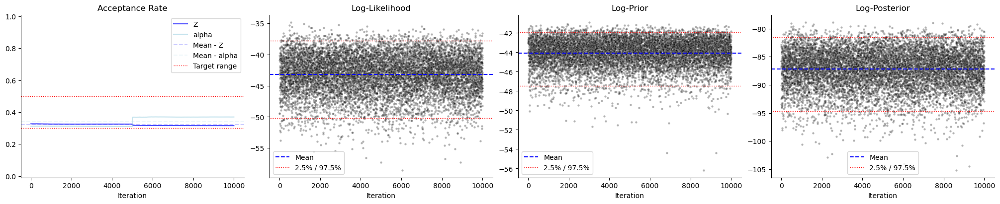

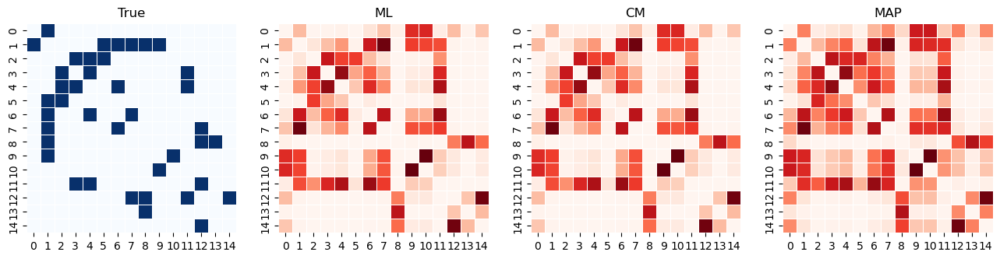

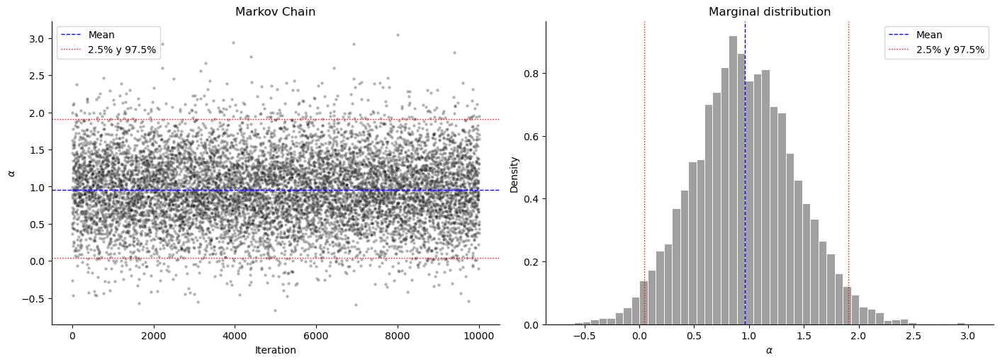

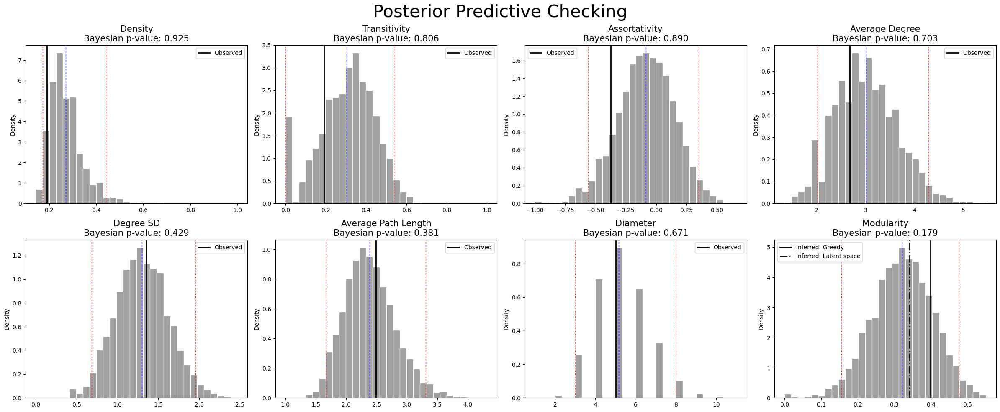

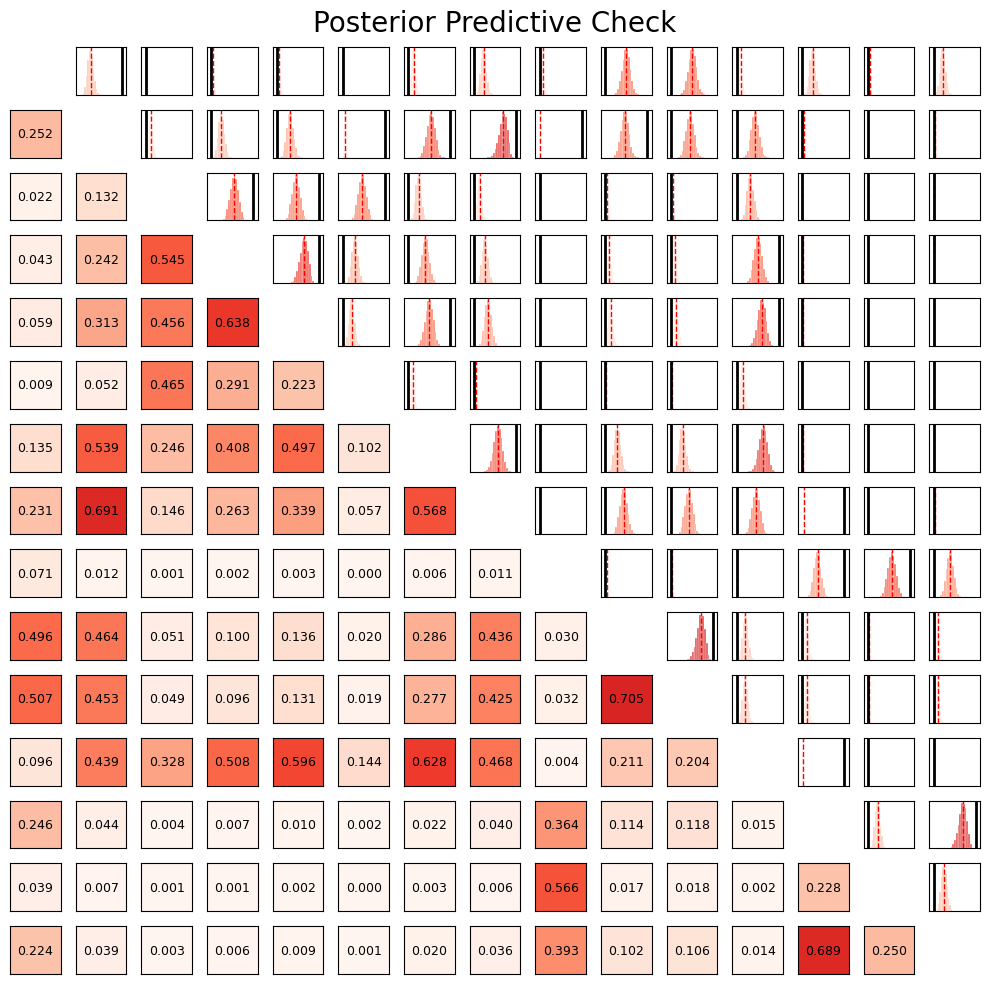

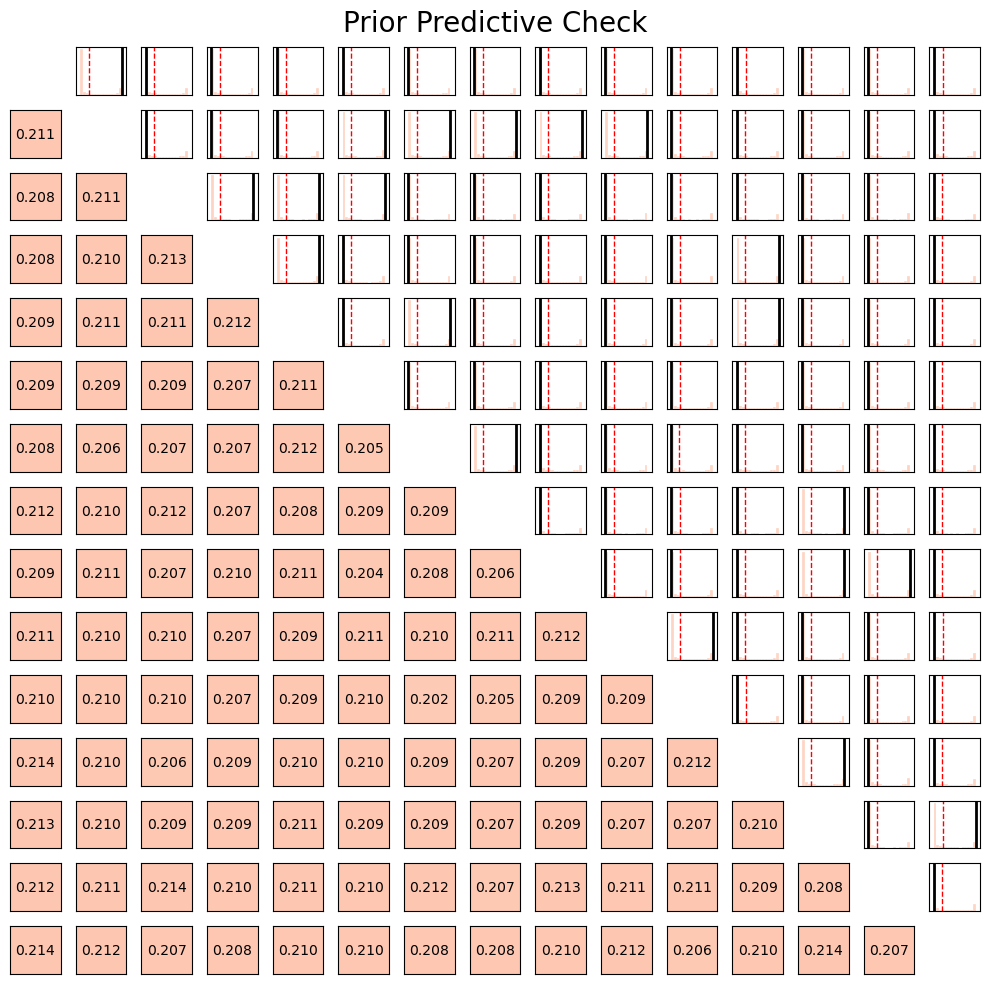

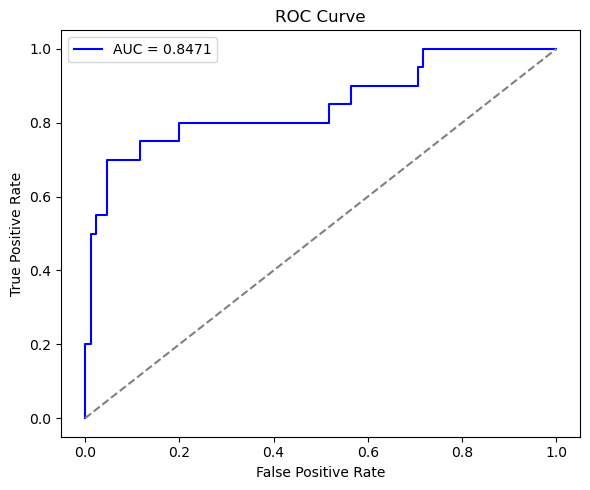

Model: Euclidean
Confussion matrix:  {'tp': 10, 'tn': 83, 'fp': 2, 'fn': 10}
AUC: 0.8471
Accuracy: 0.8857
Precision: 0.8333
Recall: 0.5000
F1-score: 0.6250
Specificity: 0.9765
Results successfully saved to: resultsR1.pkl


In [3]:
# Configuration
Theta_R1 = {
    'Z0': np.random.normal(0, 1, size=(n, 1)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 50,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR1 = Estimation_LSMN(Y, Theta_R1, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR1)

#Visualizing latent space
plot_latent_space(resultsR1)

# Posterior predictive checking
posterior_predictive_check(resultsR1)

# Prior predictive checking
prior_predictive_check(resultsR1)

# Prediction evaluation
metricsR1 = prediction_evaluation(resultsR1)

# Save results
handle_results(resultsR1, filepath='resultsR1.pkl', mode='save')

# Model $\mathbb{R}^2$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 50
Number of draws per chain: 300000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 25 starts: -28.9775
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 50698/300000 [00:11<00:57, 4320.87 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.6055
Final sigma_q_alpha: 0.8734


Sampling progress: 100%|██████████| 300000/300000 [01:07<00:00, 4427.30 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 51092/300000 [00:11<00:56, 4419.98 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.4056
Final sigma_q_alpha: 0.9511


Sampling progress: 100%|██████████| 300000/300000 [01:11<00:00, 4225.08 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0048
Minimum ESS/n: 0.0441
Maximum ESS/n: 0.5650
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -50.0515         -54.7561        -104.8076
ML                 -28.9775         -66.4854         -95.4629
CM                 -34.6777         -62.8415         -97.5192
MAP                -21.4522         -64.2459         -85.6981
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 160.9027
DIC: 157.0387
BIC: 262.9380

Final acceptance rate Z: 0.3563
Final acceptance rate alpha: 0.4073
********************************
E

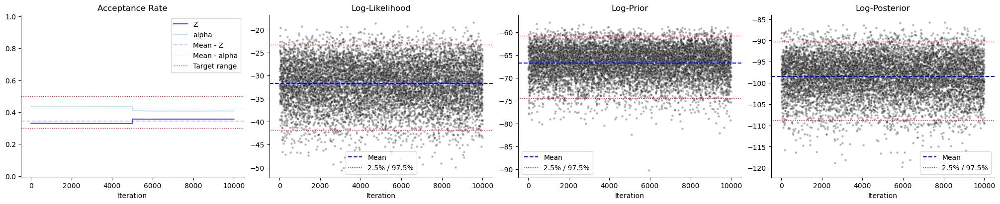

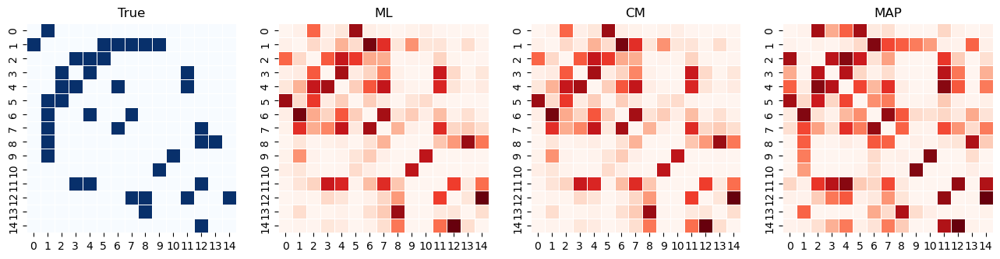

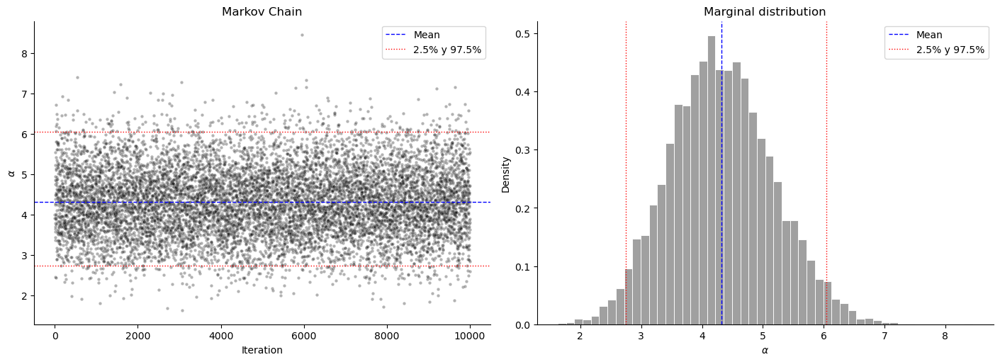

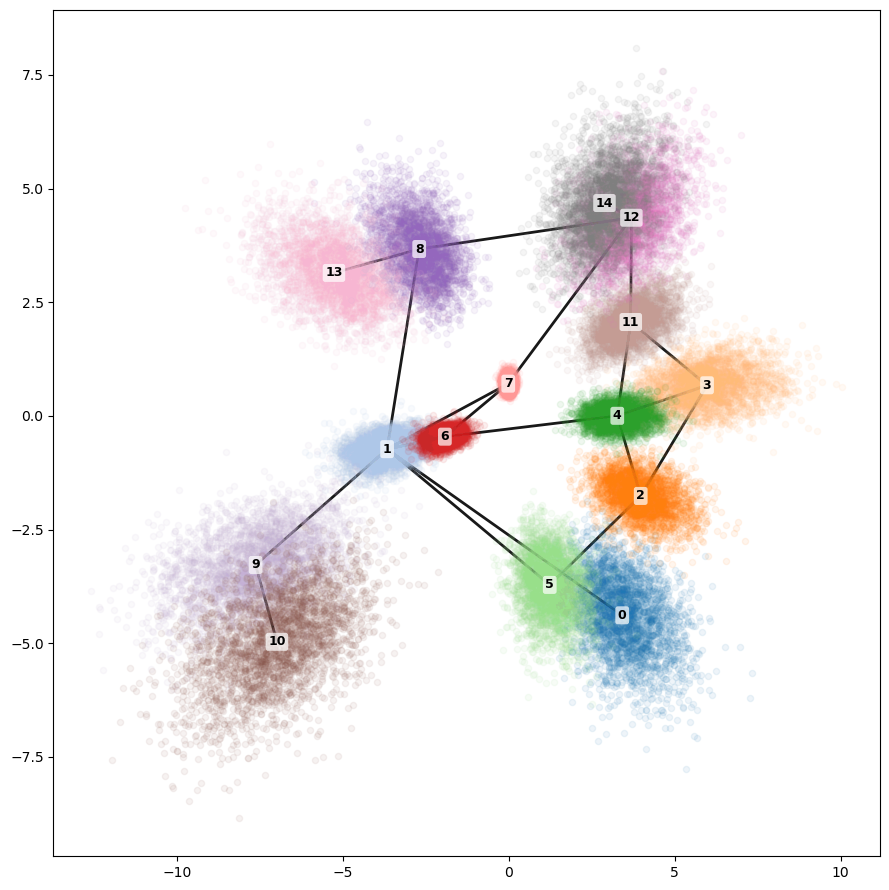

In [4]:
Theta_R2 = {
    'Z0': np.random.normal(0, 1, size=(n, 2)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 50,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR2 = Estimation_LSMN(Y, Theta_R2, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR2)

#Visualizing latent space
plot_latent_space(resultsR2)

# Posterior predictive checking
#posterior_predictive_check(resultsR2)

# Prior predictive checking
#prior_predictive_check(resultsR2)

# Prediction evaluation
#metricsR2 = prediction_evaluation(resultsR2)

# Save results
#handle_results(resultsR2, filepath='resultsR2.pkl', mode='save')

# Model $\mathbb{R}^3$

Metropolis-Hastings for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 50
Number of draws per chain: 300000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 25 starts: -26.6740
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 50950/300000 [00:13<01:02, 4011.35 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.6055
Final sigma_q_alpha: 0.9559


Sampling progress: 100%|██████████| 300000/300000 [01:17<00:00, 3875.74 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 50940/300000 [00:13<01:02, 4015.30 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.4419
Final sigma_q_alpha: 1.1967


Sampling progress: 100%|██████████| 300000/300000 [01:15<00:00, 3993.36 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0052
Minimum ESS/n: 0.0868
Maximum ESS/n: 0.5902
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -58.7771         -68.7655        -127.5427
ML                 -26.6740         -96.0947        -122.7687
CM                 -29.6803         -83.2609        -112.9412
MAP                -16.9275         -84.0674        -100.9949
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 174.8796
DIC: 163.6328
BIC: 303.0584

Final acceptance rate Z: 0.3267
Final acceptance rate alpha: 0.3512
********************************
E

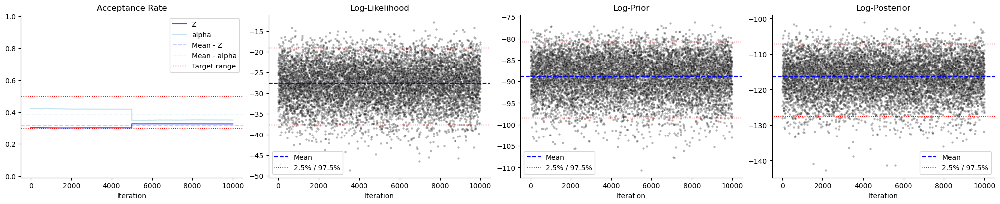

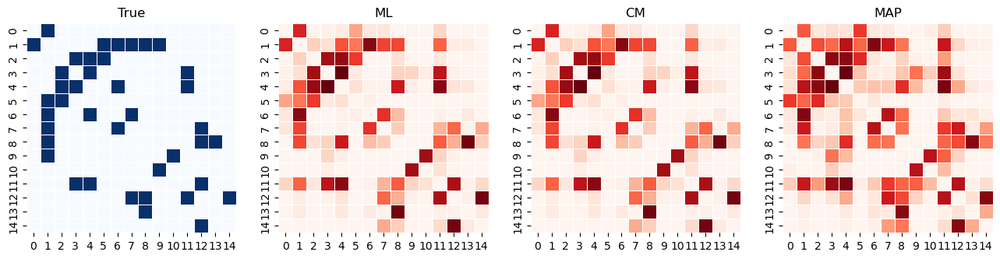

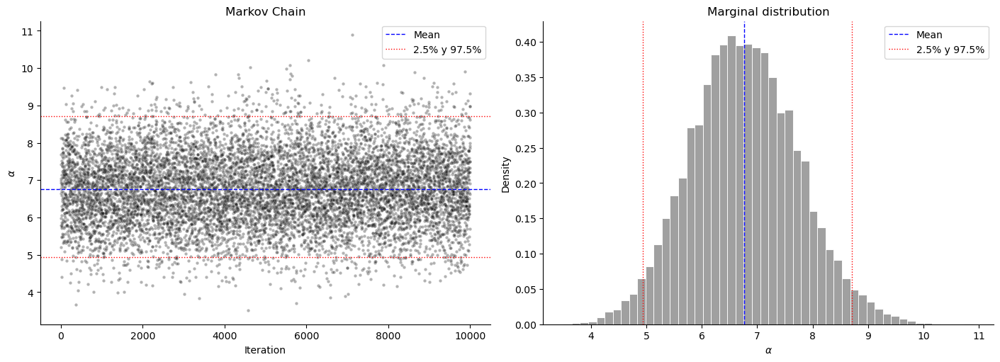

In [5]:
# Configuration
Theta_R3 = {
    'Z0': np.random.normal(0, 1, size=(n, 3)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 50,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0    
}

# Estimation
resultsR3 = Estimation_LSMN(Y, Theta_R3, Model="Euclidean")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsR3)

#Visualizing latent space
plot_latent_space(resultsR3)

# Posterior predictive checking
#posterior_predictive_check(resultsR3)

# Prior predictive checking
#prior_predictive_check(resultsR3)

# Prediction evaluation
#metricsR3 = prediction_evaluation(resultsR3)

# Save results
#handle_results(resultsR3, filepath='resultsR3.pkl', mode='save')

# Model $\mathbb{S}^1$

Metropolis-Hastings for Spherical latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 50
Number of draws per chain: 300000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 0.5000
Initial sigma_q_beta: 0.5000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 25 starts: -35.2814
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  1.0
sigma_prior_beta:  1.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 51174/300000 [00:15<00:57, 4296.92 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.3902
Final sigma_q_alpha: 1.1968
Final sigma_q_beta: 1.3995


Sampling progress: 100%|██████████| 300000/300000 [01:13<00:00, 4092.35 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 50635/300000 [00:12<01:00, 4100.01 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 1.3464
Final sigma_q_alpha: 0.8031
Final sigma_q_beta: 1.6305


Sampling progress: 100%|██████████| 300000/300000 [01:11<00:00, 4218.81 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0056
Minimum ESS/n: 0.0530
Maximum ESS/n: 0.9204
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -160.9909         -46.5490        -207.5398
ML                 -35.2814         -78.7284        -114.0098
CM                 -45.8548         -58.5424        -104.3972
MAP                -44.7247         -53.6711         -98.3958
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 386.0999
DIC: 260.2522
BIC: 253.2913

Final acceptance rate Z: 0.3357
Final acceptance rate alpha: 0.4399
Final acceptance rate beta: 0.3371

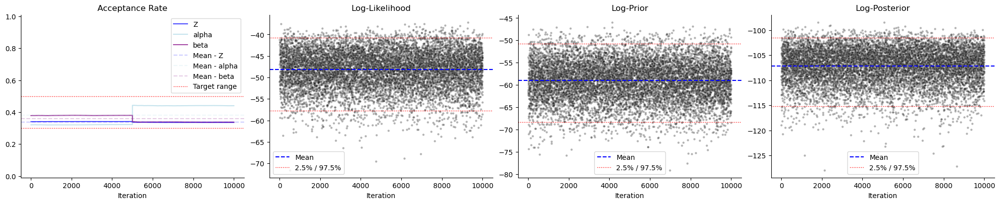

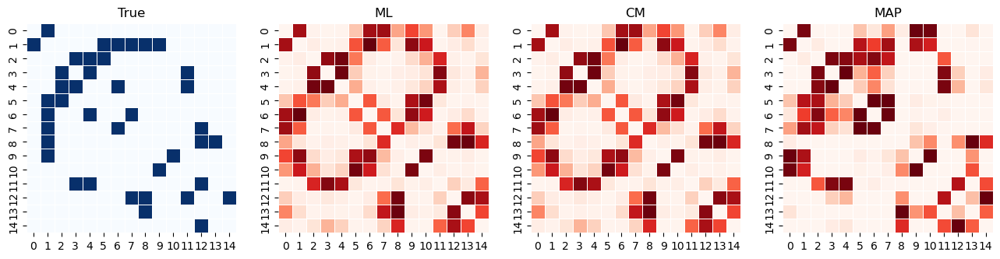

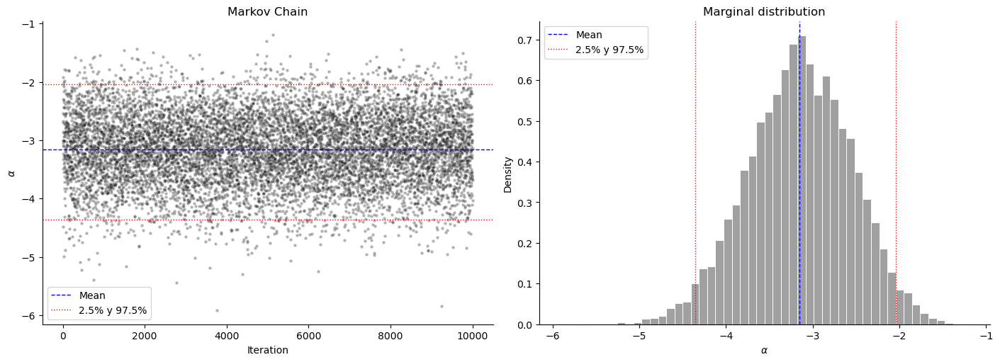

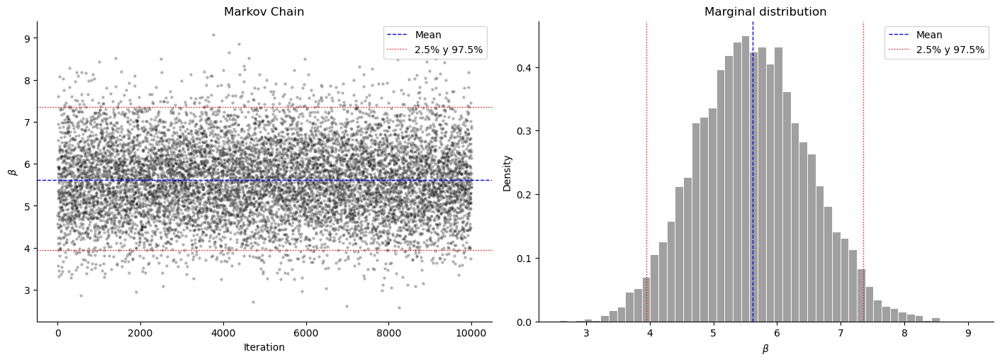

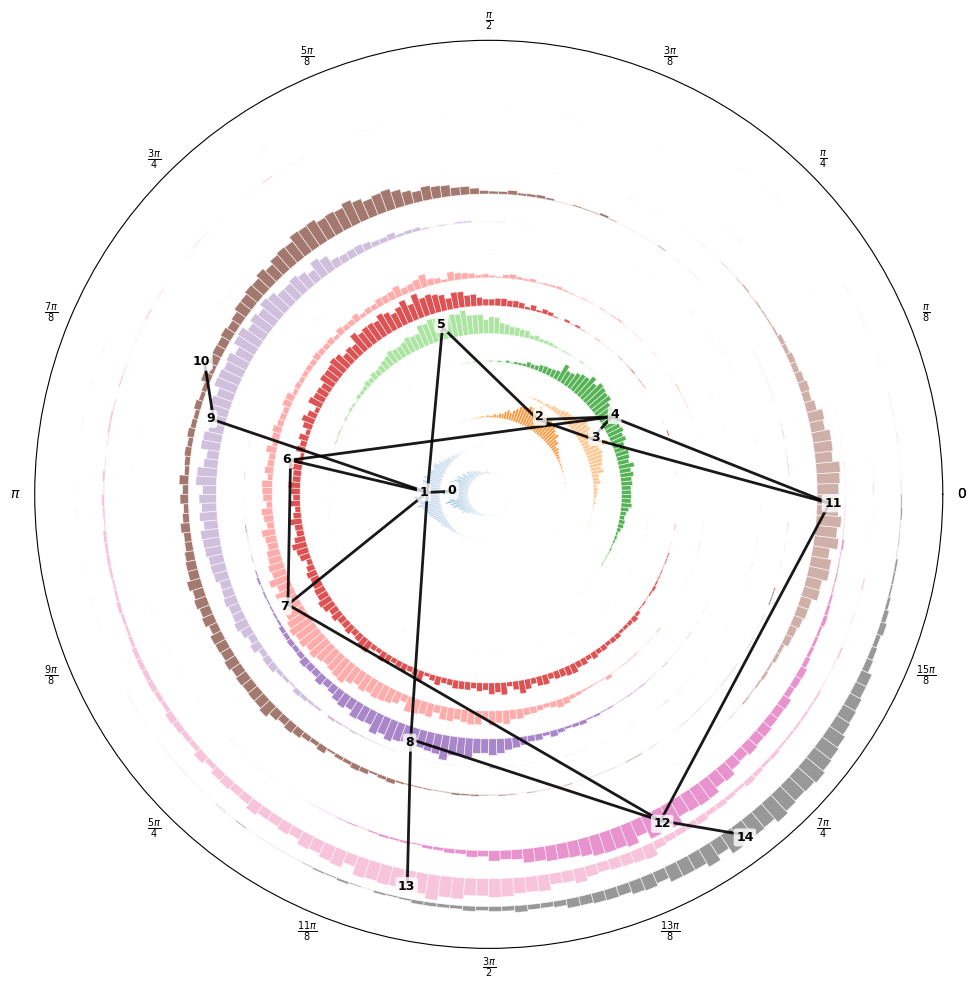

In [6]:
# Configuration
Theta_S1 = {
    'Z0': random_VMF(np.array([0,1]), 0, n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 10.0]),
    'sigma_prior_alpha': 1.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 50,                
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 0.5,    
    'sigma_q_beta': 0.5      
}

# Estimation
resultsS1 = Estimation_LSMN(Y, Theta_S1, Model="Spherical")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsS1)

#Visualizing latent space
plot_latent_space(resultsS1)

# Posterior predictive checking
#posterior_predictive_check(resultsS1)

# Prior predictive checking
#prior_predictive_check(resultsS1)

# Prediction evaluation
#metricsS1 = prediction_evaluation(resultsS1)

# Save results
#handle_results(resultsS1, filepath='resultsS1.pkl', mode='save')

# Model $\mathbb{S}^2$

Metropolis-Hastings for Spherical latent space models on networks
Number of chains: 2
MH samples of size 5000 with burn-in 50000 and thinning 50
Number of draws per chain: 300000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 0.5000
Initial sigma_q_beta: 0.5000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 25 starts: -36.8625
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  5.0
sigma_prior_beta:  1.0
********************************
Chain 0
********************************


Sampling progress:  17%|█▋        | 50802/300000 [00:16<01:00, 4137.32 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 10.7345
Final sigma_q_alpha: 1.3356
Final sigma_q_beta: 2.1028


Sampling progress: 100%|██████████| 300000/300000 [01:15<00:00, 3996.31 draws/s]


********************************
Chain 1
********************************


Sampling progress:  17%|█▋        | 50842/300000 [00:12<00:59, 4173.95 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 12.7879
Final sigma_q_alpha: 1.4538
Final sigma_q_beta: 1.8902


Sampling progress: 100%|██████████| 300000/300000 [01:18<00:00, 3837.82 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9999
Maximum R-hat: 1.0034
Minimum ESS/n: 0.0571
Maximum ESS/n: 0.9353
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -153.8734         -58.4329        -212.3063
ML                 -36.8625         -76.0079        -112.8705
CM                 -13.6454         -42.7535         -56.3989
MAP                -16.3511         -42.6351         -58.9862
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 198.9086
DIC: 162.2096
BIC: 247.6939

Final acceptance rate Z: 0.4491
Final acceptance rate alpha: 0.3221
Final acceptance rate beta: 0.3289

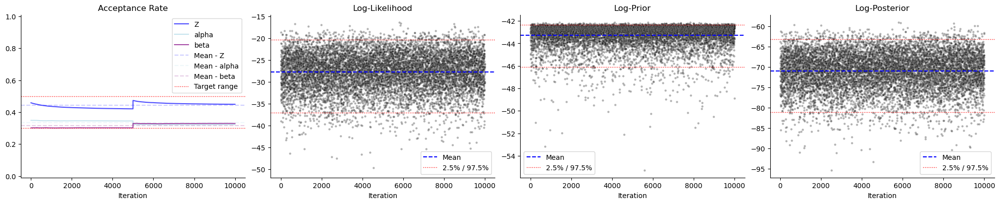

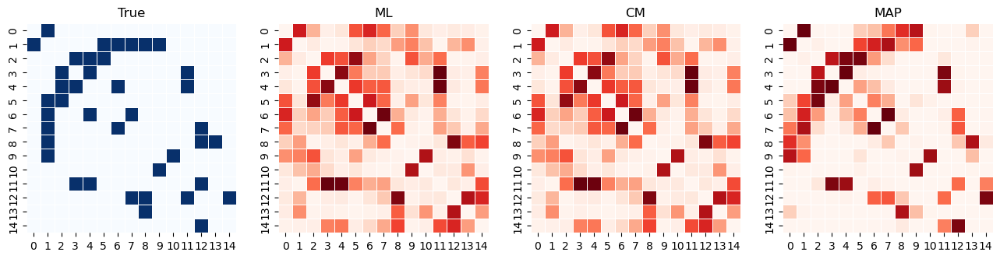

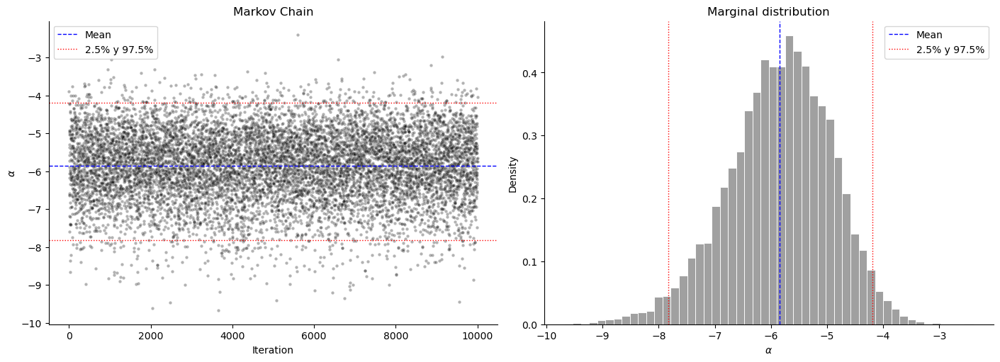

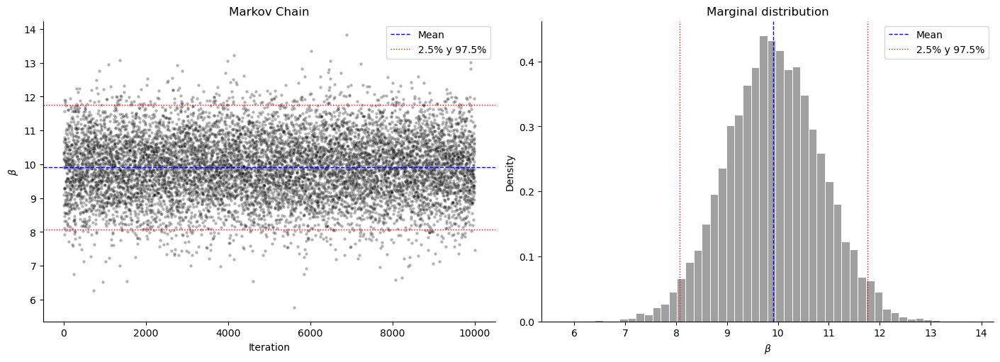

In [8]:
# Configuration
Theta_S2 = {
    'Z0': random_VMF(np.array([0,0,1]), 0, n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 10.0]),
    'sigma_prior_alpha': 5.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 5000,      
    'burn_in': 50000,       
    'thin': 50,                
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 0.5,    
    'sigma_q_beta': 0.5    
}


# Estimation
resultsS2 = Estimation_LSMN(Y, Theta_S2, Model="Spherical")

# Diagnostic analysis: Acceptance rate, Log probabilities traces, Adjacency matrices of point estimations, Traces of fixed parameters
plot_mcmc_diagnostics_panel(resultsS2)

#Visualizing latent space
plot_latent_space(resultsS2)

# Posterior predictive checking
#posterior_predictive_check(resultsS2)

# Prior predictive checking
#prior_predictive_check(resultsS2)

# Prediction evaluation
#metricsS2 = prediction_evaluation(resultsS2)

# Save results
#handle_results(resultsS2, filepath='resultsS2.pkl', mode='save')

# Model comparison


In [ ]:
#resultsR1 = handle_results(filepath='resultsR1.pkl', mode='load')
#resultsR2 = handle_results(filepath='resultsR2.pkl', mode='load')
#resultsR3 = handle_results(filepath='resultsR3.pkl', mode='load')
#resultsS1 = handle_results(filepath='resultsS1.pkl', mode='load')
#resultsS2 = handle_results(filepath='resultsS2.pkl', mode='load')

results_dict = {
    'R1': resultsR1,
    'R2': resultsR2,
    'R3': resultsR3,
    'S1': resultsS1,
    'S2': resultsS2
}

In [ ]:
df_comparison = model_comparison(results_dict)
df_comparison

,Model,WAIC,DIC,BIC,mean_log_likelihood,ml_log_likelihood,cm_log_likelihood,map_log_likelihood,min_Rhat,max_Rhat,...,False positive,False negative,p_value_density,p_value_transitivity,p_value_assortativity,p_value_average_degree,p_value_degree_sd,p_value_average_path_length,p_value_diameter,p_value_modularity
0,R1,169.186789,167.142895,222.881412,-43.130335,-42.584110,-39.691020,-39.463556,0.9999,1.0149,...,5,12,0.9496,0.8440,0.906653,0.7499,0.4283,0.3085,0.6562,0.1648
1,R2,105.356936,105.529755,211.987438,-31.510615,-23.261838,-21.940027,-22.401451,0.9999,1.0317,...,1,8,0.8812,0.8903,0.902241,0.6029,0.2699,0.5079,0.7573,0.4713
2,R3,130.285542,127.370529,270.774222,-27.649994,-21.105490,-21.609224,-24.683655,0.9999,1.0460,...,4,5,0.9204,0.9361,0.975095,0.8254,0.5736,0.4165,0.7632,0.2241
3,S1,385.066878,257.290879,257.118936,-48.271895,-40.147542,-44.710143,-42.286469,0.9999,1.0499,...,3,5,0.9926,0.9979,0.980000,0.9843,0.1980,0.4366,0.6595,0.5797
4,S2,196.758479,160.308802,248.343611,-27.538469,-32.086964,-13.582198,-15.384920,0.9999,1.1307,...,0,5,0.8753,0.9354,0.949000,0.7076,0.1461,0.6272,0.8589,0.5248


In [ ]:
df_comparison[['Model','WAIC', 'mean_log_likelihood', 'ml_log_likelihood', 'cm_log_likelihood', 'map_log_likelihood']]

,Model,WAIC,mean_log_likelihood,ml_log_likelihood,cm_log_likelihood,map_log_likelihood
0,R1,169.186789,-43.130335,-42.584110,-39.691020,-39.463556
1,R2,105.356936,-31.510615,-23.261838,-21.940027,-22.401451
2,R3,130.285542,-27.649994,-21.105490,-21.609224,-24.683655
3,S1,385.066878,-48.271895,-40.147542,-44.710143,-42.286469
4,S2,196.758479,-27.538469,-32.086964,-13.582198,-15.384920


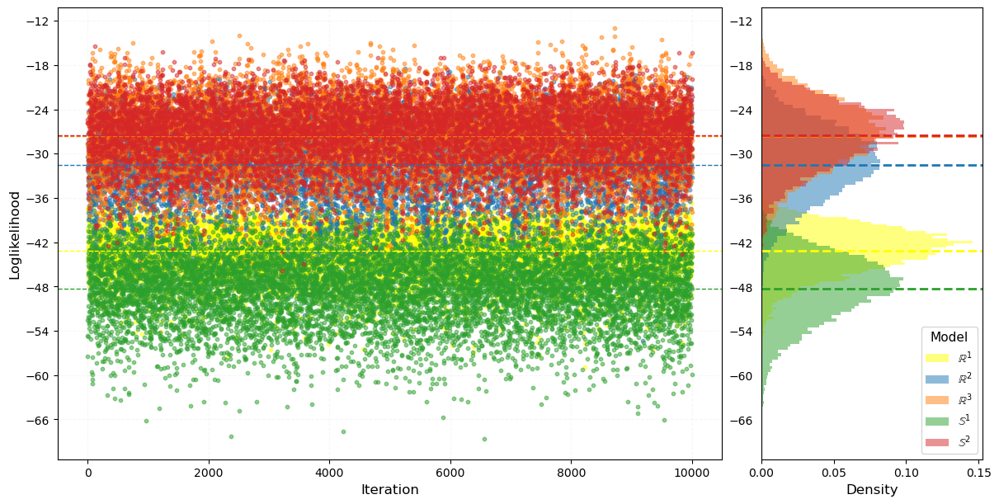

In [ ]:
plot_loglikelihood_comparison(results_dict)

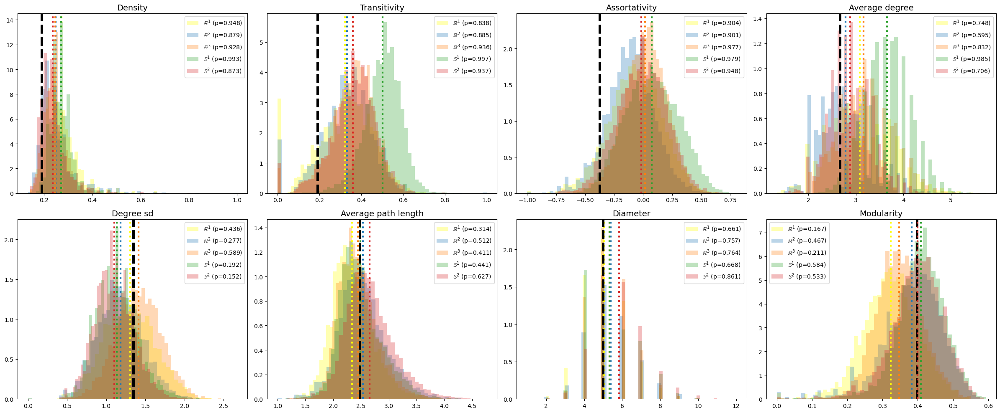

In [ ]:
compare_posterior_predictive_checks(results_dict)

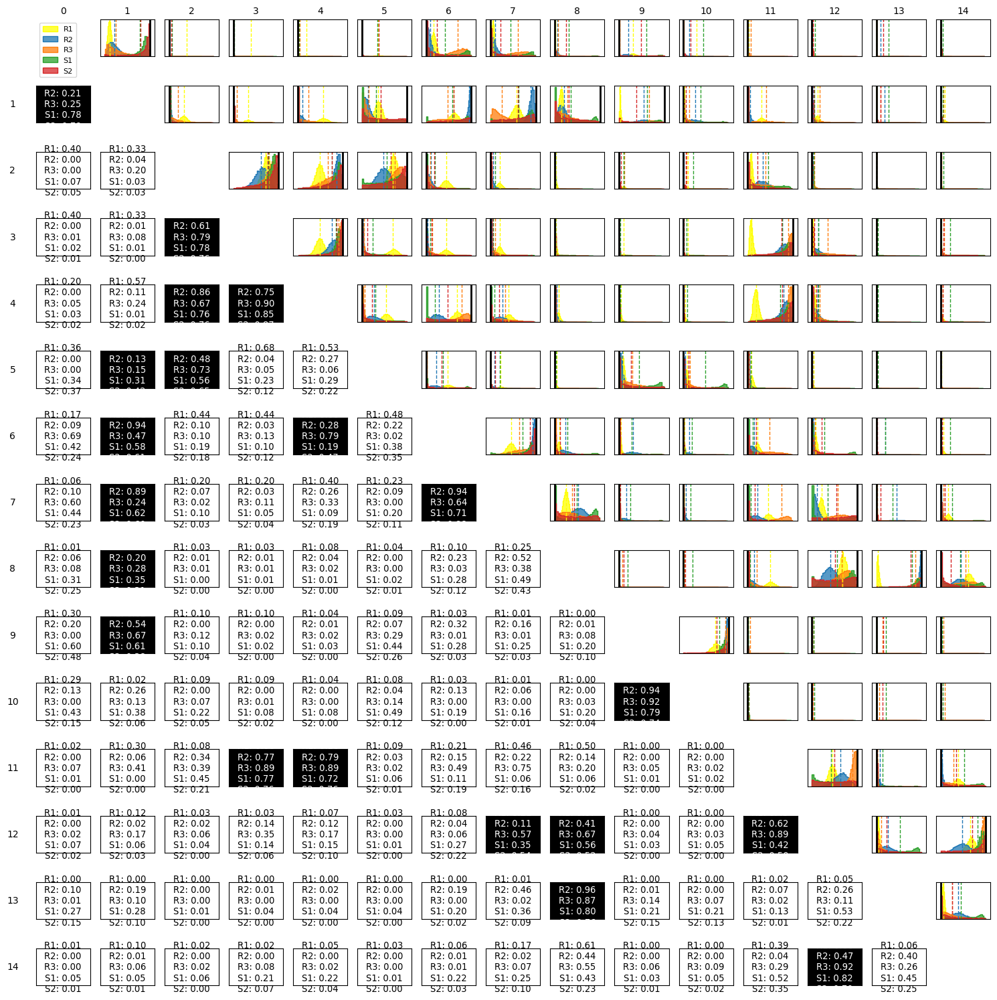

In [ ]:
#pairwise_sociomatrix_plot_all_models(results_dict)

Model: Euclidean (R1)
Confusion matrix: tp=8, tn=80, fp=5, fn=12
AUC: 0.8294 | Accuracy: 0.8381 | Precision: 0.6154
Recall: 0.4000 | F1-score: 0.4848 | Specificity: 0.9412
Model: Euclidean (R2)
Confusion matrix: tp=12, tn=84, fp=1, fn=8
AUC: 0.9518 | Accuracy: 0.9143 | Precision: 0.9231
Recall: 0.6000 | F1-score: 0.7273 | Specificity: 0.9882
Model: Euclidean (R3)
Confusion matrix: tp=15, tn=81, fp=4, fn=5
AUC: 0.9571 | Accuracy: 0.9143 | Precision: 0.7895
Recall: 0.7500 | F1-score: 0.7692 | Specificity: 0.9529
Model: Spherical (S1)
Confusion matrix: tp=15, tn=82, fp=3, fn=5
AUC: 0.9429 | Accuracy: 0.9238 | Precision: 0.8333
Recall: 0.7500 | F1-score: 0.7895 | Specificity: 0.9647
Model: Spherical (S2)
Confusion matrix: tp=15, tn=85, fp=0, fn=5
AUC: 0.9941 | Accuracy: 0.9524 | Precision: 1.0000
Recall: 0.7500 | F1-score: 0.8571 | Specificity: 1.0000


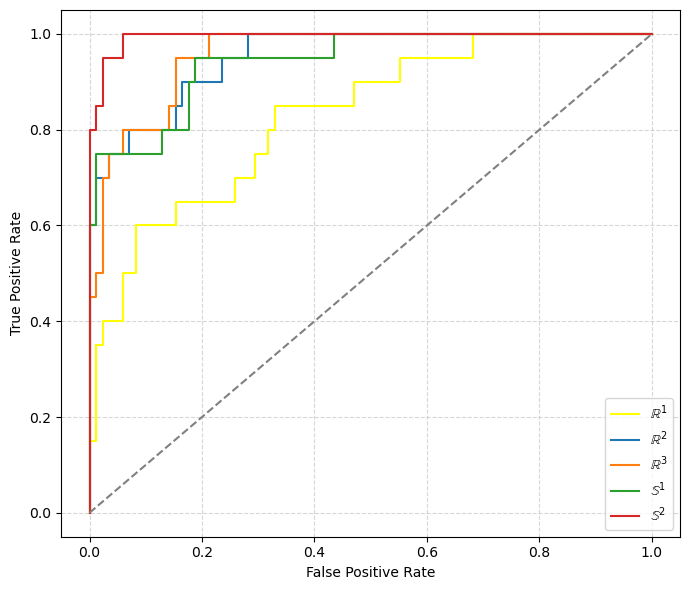

,Model,AUC,Accuracy,Precision,Recall,F1,Specificity,TP,TN,FP,FN
0,R1,0.829412,0.838095,0.615385,0.40,0.484848,0.941176,8,80,5,12
1,R2,0.951765,0.914286,0.923077,0.60,0.727273,0.988235,12,84,1,8
2,R3,0.957059,0.914286,0.789474,0.75,0.769231,0.952941,15,81,4,5
3,S1,0.942941,0.923810,0.833333,0.75,0.789474,0.964706,15,82,3,5
4,S2,0.994118,0.952381,1.000000,0.75,0.857143,1.000000,15,85,0,5


In [ ]:
df_metrics = compare_prediction_evaluation(results_dict)
df_metrics

In [ ]:
latent_variance(results_dict).mean()

R1    0.389982
R2    1.537378
R3    3.314539
S1    0.395528
S2    0.148957
dtype: float64

In [ ]:
centrality_analysis(results_dict)['correlation']

,Degree vs Probability connection,Degree vs Mean distance,Degree vs Center distance
R1,0.628474,-0.606637,-0.700006
R2,0.681040,-0.644182,-0.574188
R3,0.683231,-0.793443,-0.804886
S1,0.322082,-0.257962,-0.022060
S2,0.757051,-0.659297,-0.813390


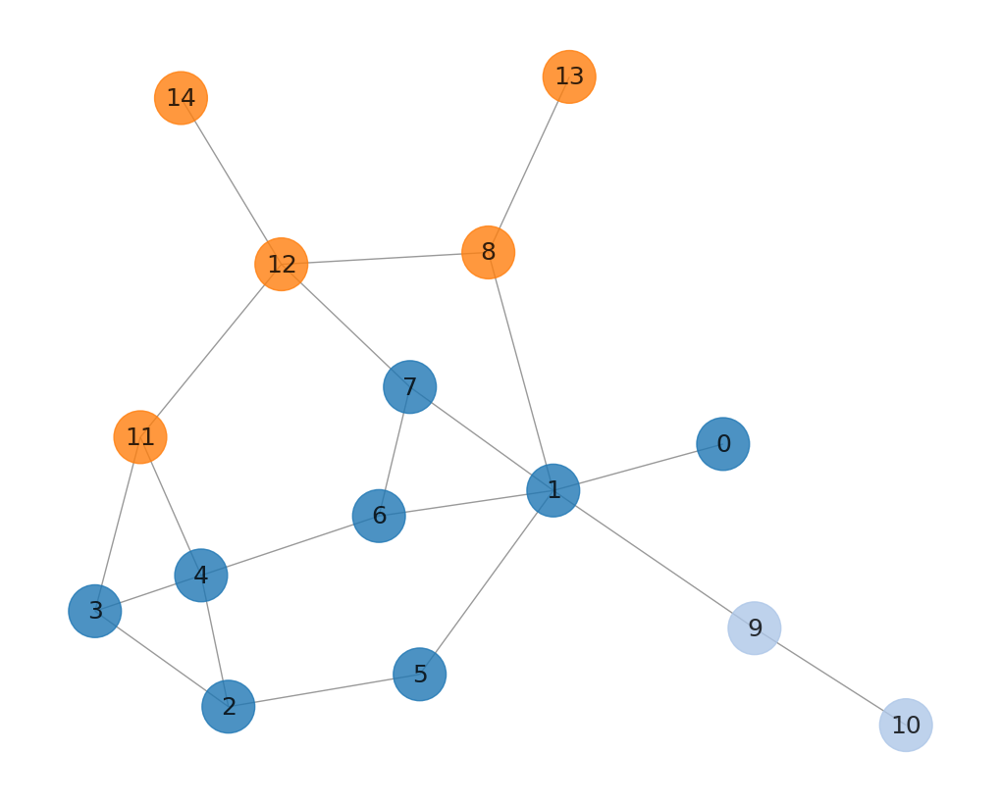

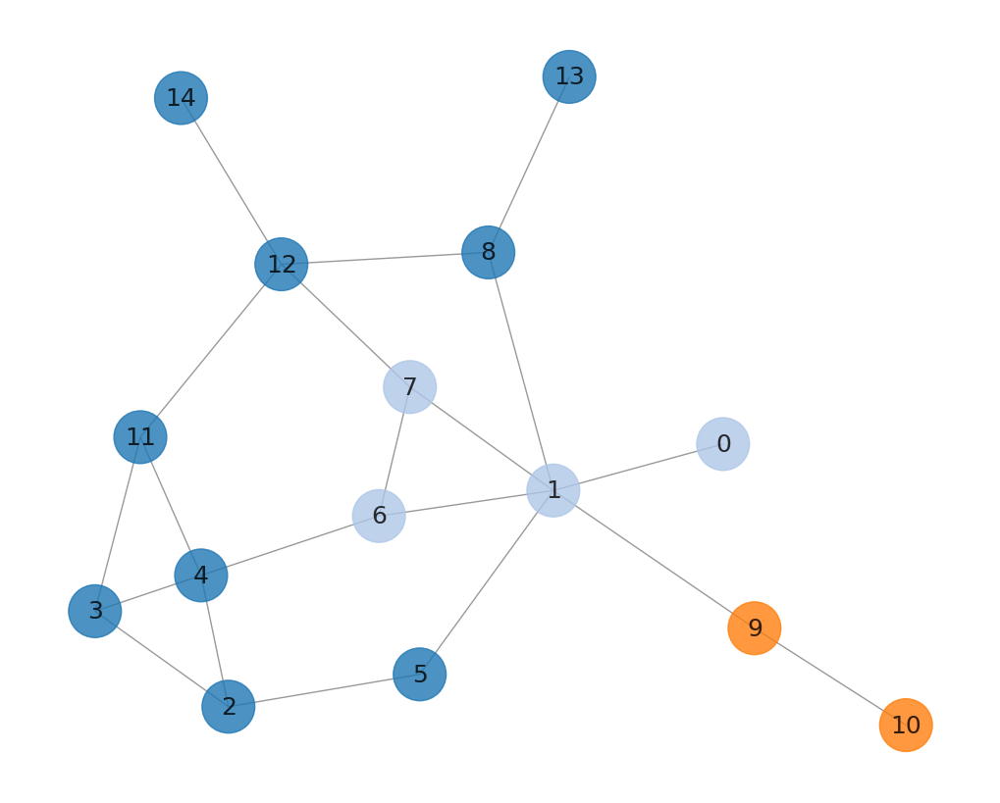

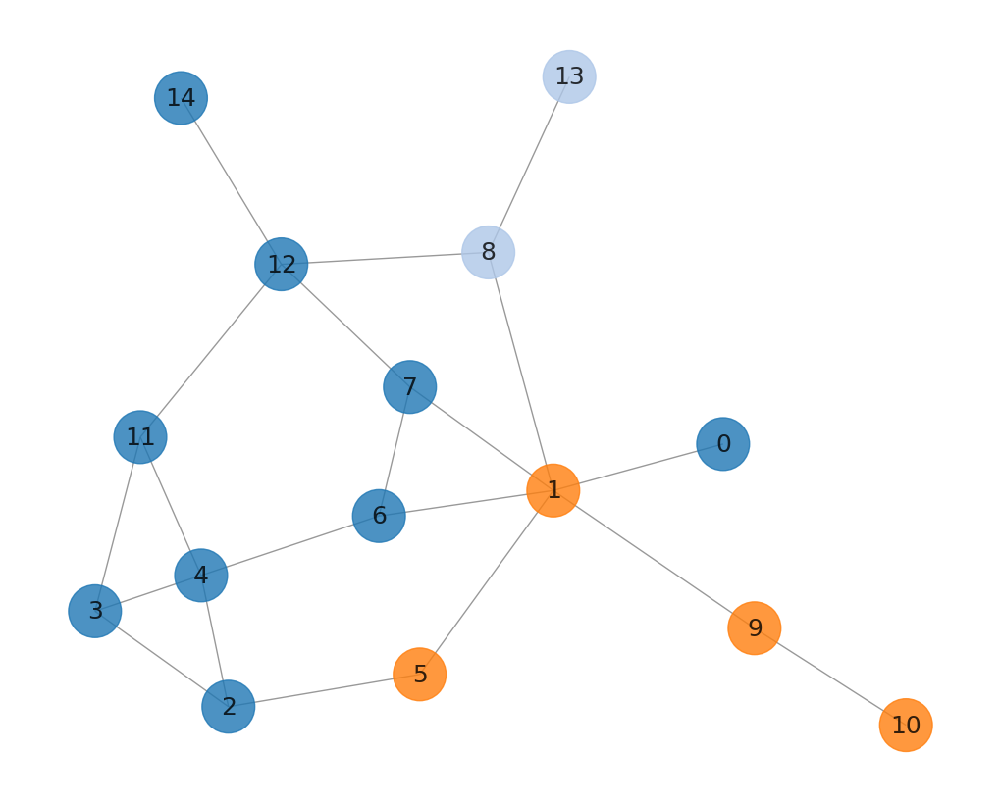

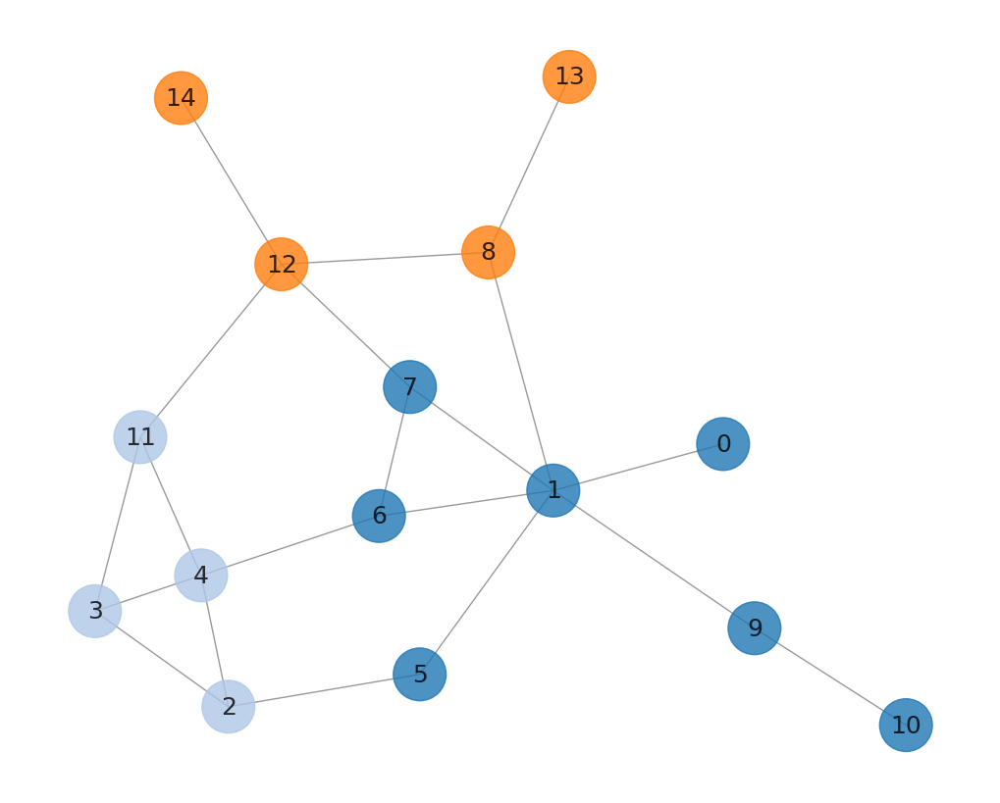

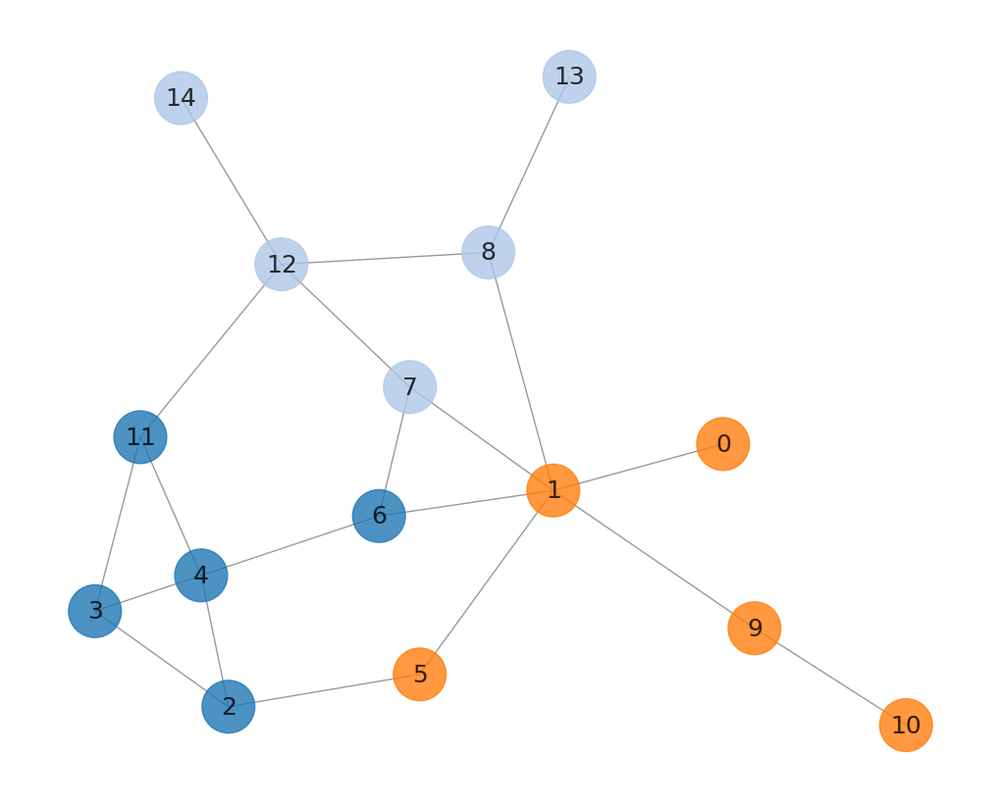

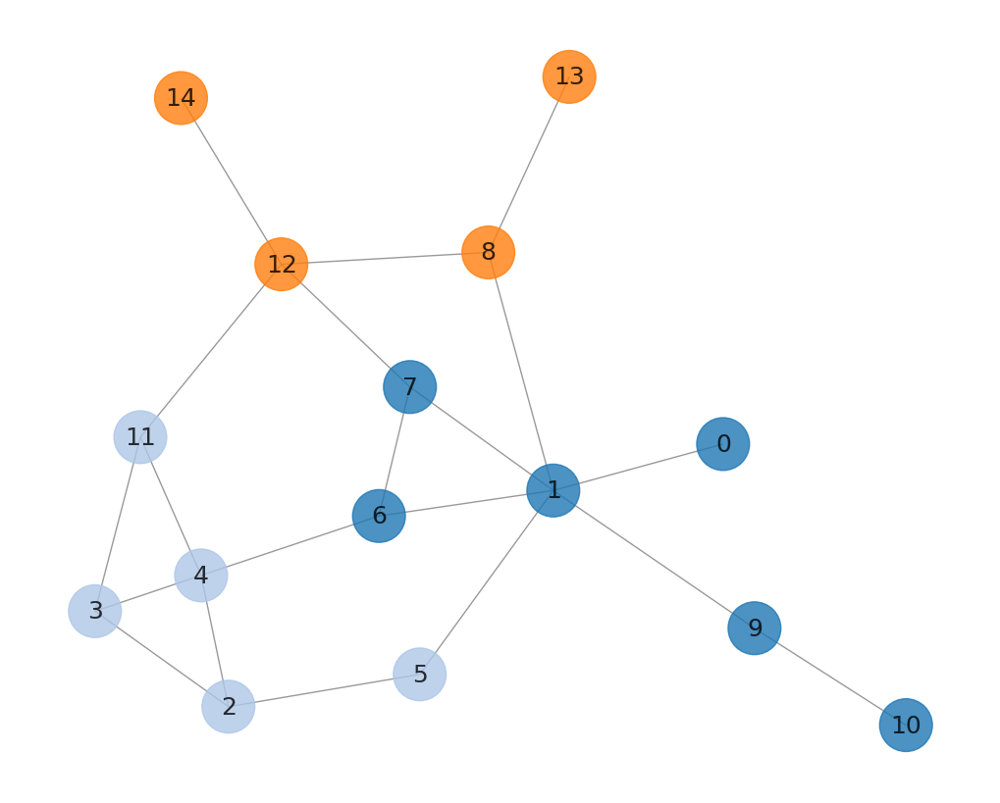

,Model,k,modularity
0,R1,3,0.26375
1,R2,3,0.27875
2,R3,3,0.22375
3,S1,3,0.39125
4,S2,3,0.36000
5,Observed,3,0.39875


In [ ]:
latent_clustering(results_dict,range(3,4))
